In [2]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

import librosa
import librosa.display
import IPython.display as ipd
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import numpy as np
from sklearn.model_selection import train_test_split
import pywt
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Activation, Input
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv2D,Conv1D
from tensorflow.keras.layers import MaxPooling2D
from keras.utils import to_categorical
from matplotlib import cm
%matplotlib inline
from sklearn import metrics
import tensorflow as tf
import itertools


#Constant used throughout the notebook
PATH_TRAINING_DATASET = r"C:\Users\sylv_\Desktop\audio for asd"

In [3]:
def build_dataframe(machine_str = 'valve'):
    #Get list of files in train and test directory
    path_train_folder = PATH_TRAINING_DATASET + "\\dev_" + machine_str + "\\" + machine_str + "\\train"
    path_test_folder = PATH_TRAINING_DATASET  + "\\dev_" + machine_str + "\\" + machine_str + "\\test"

    train_files = [f for f in os.listdir(path_train_folder)]
    test_files = [f for f in os.listdir(path_test_folder)]

    #Get list of dictionnary for creating DataFrame
    list_dict_file = []

    #Loop through filenames
    for filename in train_files:

        #Get filename as list of string
        splitted_filename = filename.split('_')

        #Append dictionnary to list
        list_dict_file.append({
            'filepath' : path_train_folder + "\\" + filename,
            'filename' : filename,
            'section' : int(splitted_filename[1]),
            'domain_env' : splitted_filename[2],
            'dir' : splitted_filename[3],
            'sound_type' : splitted_filename[4],
            'id' : splitted_filename[5],
            'suffix' : '_'.join(splitted_filename[6:])        #.split('.')[0]  --> want to keep the complete suffix
        })

    #Loop through filenames
    for filename in test_files:

        #Get filename as list of string
        splitted_filename = filename.split('_')

        #Append dictionnary to list
        list_dict_file.append({
            'filepath' : path_test_folder  + "\\" + filename,
            'filename' : filename,
            'section' : int(splitted_filename[1]),
            'domain_env' : splitted_filename[2],
            'dir' : splitted_filename[3],
            'sound_type' : splitted_filename[4],
            'id' : splitted_filename[5],
            'suffix' : '_'.join(splitted_filename[6:])     #.split('.')[0]  --> want to keep the complete suffix
        })
        
    return pd.DataFrame(list_dict_file)


def sound_from_file(filename, machine_str = 'valve', dataset = 'train'):
    df = build_dataframe(machine_str)
    path = PATH_TRAINING_DATASET + "\\dev_" + machine_str + "\\" + machine_str + "\\" + dataset + "\\" + filename
    return df[df['filepath']==path].iloc[0]
    


df_fan = build_dataframe('fan')
df_valve = build_dataframe('valve')
df_bearing = build_dataframe('bearing')
df_slider = build_dataframe('slider')
df_car = build_dataframe('ToyCar')
df_train = build_dataframe('ToyTrain')
df_gearbox = build_dataframe('gearbox')

df_slider.info()
df_slider.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3600 entries, 0 to 3599
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filepath    3600 non-null   object
 1   filename    3600 non-null   object
 2   section     3600 non-null   int64 
 3   domain_env  3600 non-null   object
 4   dir         3600 non-null   object
 5   sound_type  3600 non-null   object
 6   id          3600 non-null   object
 7   suffix      3600 non-null   object
dtypes: int64(1), object(7)
memory usage: 225.1+ KB


,filepath,filename,section,domain_env,dir,sound_type,id,suffix
0,C:\Users\sylv_\Desktop\audio for asd\dev_slide...,section_00_source_train_normal_0000_vel_700.wav,0,source,train,normal,0000,vel_700.wav
1,C:\Users\sylv_\Desktop\audio for asd\dev_slide...,section_00_source_train_normal_0001_vel_500.wav,0,source,train,normal,0001,vel_500.wav
2,C:\Users\sylv_\Desktop\audio for asd\dev_slide...,section_00_source_train_normal_0002_vel_900.wav,0,source,train,normal,0002,vel_900.wav
3,C:\Users\sylv_\Desktop\audio for asd\dev_slide...,section_00_source_train_normal_0003_vel_300.wav,0,source,train,normal,0003,vel_300.wav
4,C:\Users\sylv_\Desktop\audio for asd\dev_slide...,section_00_source_train_normal_0004_vel_1100.wav,0,source,train,normal,0004,vel_1100.wav


In [4]:
df_all= pd.concat([df_fan,df_valve,df_bearing,df_slider,df_car,df_train,df_gearbox]).reset_index()
df_all= df_all.drop('index', axis = 1)
df_all.head(10)

df_all.info()
Z=df_all[df_all.dir == 'train']
Z.info()

Y=Z.suffix
Y.info()
Y.describe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25199 entries, 0 to 25198
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filepath    25199 non-null  object
 1   filename    25199 non-null  object
 2   section     25199 non-null  int64 
 3   domain_env  25199 non-null  object
 4   dir         25199 non-null  object
 5   sound_type  25199 non-null  object
 6   id          25199 non-null  object
 7   suffix      25199 non-null  object
dtypes: int64(1), object(7)
memory usage: 1.5+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 20999 entries, 0 to 24598
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filepath    20999 non-null  object
 1   filename    20999 non-null  object
 2   section     20999 non-null  int64 
 3   domain_env  20999 non-null  object
 4   dir         20999 non-null  object
 5   sound_type  20999 non-null  object
 6   id       

<bound method NDFrame.describe of 0        m-n_W.wav
1        m-n_X.wav
2        m-n_X.wav
3        m-n_W.wav
4        m-n_W.wav
           ...    
24594    id_00.wav
24595    id_00.wav
24596    id_02.wav
24597    id_11.wav
24598    id_00.wav
Name: suffix, Length: 20999, dtype: object>

In [5]:
def load_audio(audio_path):
    return librosa.load(audio_path, sr=None)

def logMelSpectrogram(audio, fe, dt):
    # Spectrogramme
    stfts = np.abs(librosa.stft(audio,
                                n_fft=int(dt*fe),
                                hop_length=int(dt*fe),
                                center=True
                                )).T
    num_spectrogram_bins = stfts.shape[-1]
    # Filtre de MEL
    linear_to_mel_weight_matrix = librosa.filters.mel(
        sr=fe,
        n_fft=int(dt*fe) + 1,
        n_mels=num_spectrogram_bins,
    ).T

    # Application du filtre au spectrogramme
    mel_spectrograms = np.tensordot(
        stfts,
        linear_to_mel_weight_matrix,
        1
    )
    return np.log(mel_spectrograms + 1e-6)

def load_data(audio_path, dt=0.03):
    Y_audio=[]
    for i, a_path in enumerate(audio_path):
        data, fe = load_audio(a_path)
        spectre_ft = np.abs(librosa.stft(data, n_fft= 127, hop_length = 2500))
        Y_audio.append(spectre_ft)
    a_audio = np.expand_dims(Y_audio, 3)
    return np.array(a_audio)

In [6]:
X_train_normal,X_test_normal,y_train,y_test = train_test_split(Z["filepath"] , Y, test_size=0.2, random_state= 123)

In [104]:
X_train_normal = load_data(X_train_normal)
X_test_normal = load_data(X_test_normal)

print(np.shape(X_train_normal))
print(np.shape(X_test_normal))

(16799, 64, 64, 1)
(4200, 64, 64, 1)


In [7]:
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder(dtype= 'int', handle_unknown= 'use_encoded_value',unknown_value = 143)
y_train_enc=enc.fit_transform(np.expand_dims(y_train,1))
y_test_enc=enc.transform(np.expand_dims(y_test,1))
print(y_train_enc)
print (np.shape(y_test_enc))


y_train=np.squeeze(y_train_enc,1)
y_test=np.squeeze(y_test_enc,1)

print(y_train)
print (np.shape(y_test))

[[  4]
 [  6]
 [ 65]
 ...
 [ 23]
 [ 49]
 [137]]
(4200, 1)
[  4   6  65 ...  23  49 137]
(4200,)


In [83]:
print(y_train.max(),y_train.min())
y_test.max()
print(len(np.unique(y_train)))

142 0
143


In [8]:
from tensorflow.keras.utils import Sequence
import numpy as np   

class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        return batch_x, batch_y

train_gen = DataGenerator(X_train_normal,y_train, 100)
test_gen = DataGenerator(X_test_normal,y_test,100)

In [28]:
encoder_gen= Sequential()

encodeur_1= Conv2D(32, kernel_size=(3, 3), activation='linear', padding='same',input_shape=X_train_normal.shape[1:])
encodeur_2=MaxPooling2D((2,2))
encodeur_3= Dropout(0.25)
encodeur_4= Conv2D(8, kernel_size=(3, 3), activation='linear')
encodeur_5=MaxPooling2D((2,2))
encodeur_6= Dropout(0.25)
encodeur_7= Flatten()
encodeur_8= Dense(units= 300, activation='linear')
encodeur_9= Dropout(0.5)
encodeur_10= Dense(units= len(np.unique(y_train)), activation='softmax')

encoder_gen.add(encodeur_1)
encoder_gen.add(encodeur_2)
encoder_gen.add(encodeur_3)
encoder_gen.add(encodeur_4)
encoder_gen.add(encodeur_5)
encoder_gen.add(encodeur_6)
encoder_gen.add(encodeur_7)
encoder_gen.add(encodeur_8)
encoder_gen.add(encodeur_9)
encoder_gen.add(encodeur_10)


encoder_gen.compile(loss='sparse_categorical_crossentropy',optimizer='adam', metrics=['accuracy'])
encoder_gen.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 64, 64, 32)        320       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 32, 32, 32)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 30, 30, 8)         2312      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 15, 15, 8)        0         
 2D)                                                             
                                                                 
 dropout_7 (Dropout)         (None, 15, 15, 8)        

In [29]:
history_encoder_gen=encoder_gen.fit(train_gen, epochs=100,validation_data=test_gen)

Epoch 1/100
168/168 [==============================] - 2s 9ms/step - loss: 3.1156 - accuracy: 0.2184 - val_loss: nan - val_accuracy: 0.3905
Epoch 2/100
168/168 [==============================] - 1s 8ms/step - loss: 2.0946 - accuracy: 0.4055 - val_loss: nan - val_accuracy: 0.5362
Epoch 3/100
168/168 [==============================] - 1s 8ms/step - loss: 1.6809 - accuracy: 0.5073 - val_loss: nan - val_accuracy: 0.6121
Epoch 4/100
168/168 [==============================] - 1s 8ms/step - loss: 1.4115 - accuracy: 0.5787 - val_loss: nan - val_accuracy: 0.6707
Epoch 5/100
168/168 [==============================] - 1s 8ms/step - loss: 1.2355 - accuracy: 0.6245 - val_loss: nan - val_accuracy: 0.6955
Epoch 6/100
168/168 [==============================] - 1s 8ms/step - loss: 1.1134 - accuracy: 0.6545 - val_loss: nan - val_accuracy: 0.7007
Epoch 7/100
168/168 [==============================] - 1s 8ms/step - loss: 1.0167 - accuracy: 0.6855 - val_loss: nan - val_accuracy: 0.7150
Epoch 8/100
168/168 

In [30]:
encoder_gen.save('general_encoder_64by64.h5')

In [9]:
encoder_gen= tf.keras.models.load_model("general_encoder_64by64.h5")

## Partie slider

In [10]:
##21 categories
A=df_slider[df_slider.dir == 'train']
A.info()

Y1=A.suffix
Y1.info()
Y1.describe

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000 entries, 0 to 2999
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filepath    3000 non-null   object
 1   filename    3000 non-null   object
 2   section     3000 non-null   int64 
 3   domain_env  3000 non-null   object
 4   dir         3000 non-null   object
 5   sound_type  3000 non-null   object
 6   id          3000 non-null   object
 7   suffix      3000 non-null   object
dtypes: int64(1), object(7)
memory usage: 210.9+ KB
<class 'pandas.core.series.Series'>
Int64Index: 3000 entries, 0 to 2999
Series name: suffix
Non-Null Count  Dtype 
--------------  ----- 
3000 non-null   object
dtypes: object(1)
memory usage: 46.9+ KB


<bound method NDFrame.describe of 0        vel_700.wav
1        vel_500.wav
2        vel_900.wav
3        vel_300.wav
4       vel_1100.wav
            ...     
2995       f-n_C.wav
2996       f-n_C.wav
2997       f-n_C.wav
2998       f-n_C.wav
2999       f-n_C.wav
Name: suffix, Length: 3000, dtype: object>

In [11]:
X_train_normal1,X_test_normal1,y_train1,y_test1 = train_test_split(A["filepath"] , Y1, test_size=0.2, random_state= 123)
X_train_normal_slider = load_data(X_train_normal1)
X_test_normal_slider = load_data(X_test_normal1)

print(np.shape(X_train_normal_slider))
print(np.shape(X_test_normal_slider))

(2400, 64, 64, 1)
(600, 64, 64, 1)


In [12]:
y_train_sl=enc.transform(np.expand_dims(y_train1,1))
y_test_sl=enc.transform(np.expand_dims(y_test1,1))

In [13]:
y_train_sl_red=np.squeeze(y_train_sl,1)
y_test_sl_red=np.squeeze(y_test_sl,1)

In [88]:
np.unique(y_train_sl_red)

array([  0,   1,   2,   3,   4,   5,   6,   8,  51,  52,  53,  86,  87,
       103, 104, 113, 115, 119, 121, 122])

In [89]:
unique, counts = np.unique(y_train_sl_red, return_counts=True)
print(np.asarray((unique, counts)).T)

[[  0 164]
 [  1   2]
 [  2 159]
 [  3   3]
 [  4 164]
 [  5   3]
 [  6 161]
 [  8 155]
 [ 51 413]
 [ 52 371]
 [ 53   9]
 [ 86   2]
 [ 87 157]
 [103 165]
 [104   2]
 [113 157]
 [115   2]
 [119 158]
 [121   2]
 [122 151]]


In [63]:
print(y_train_sl_red==122)  

[ True False False ... False False False]


In [14]:
X_train_normal_slider1= X_train_normal_slider [y_train_sl_red == 0]

X_train_normal_slider1.shape

(164, 64, 64, 1)

In [117]:
y_train_sl.shape

(2400, 1)

In [120]:
y_train_sl_red.shape

(2400,)

In [15]:
X_train_normal_slider2= X_train_normal_slider [y_train_sl_red == 2]
X_train_normal_slider3= X_train_normal_slider [y_train_sl_red == 4]
X_train_normal_slider4= X_train_normal_slider [y_train_sl_red == 6]
X_train_normal_slider5= X_train_normal_slider [y_train_sl_red == 8]
X_train_normal_slider6= X_train_normal_slider [y_train_sl_red == 51]
X_train_normal_slider7= X_train_normal_slider [y_train_sl_red == 52]
X_train_normal_slider8= X_train_normal_slider [y_train_sl_red == 87]
X_train_normal_slider9= X_train_normal_slider [y_train_sl_red == 103]
X_train_normal_slider10= X_train_normal_slider [y_train_sl_red == 113]
X_train_normal_slider11= X_train_normal_slider [y_train_sl_red == 119]
X_train_normal_slider12= X_train_normal_slider [y_train_sl_red == 122]

listeX_slider =(X_train_normal_slider2,X_train_normal_slider3,X_train_normal_slider4,X_train_normal_slider5,
                X_train_normal_slider6,X_train_normal_slider7,X_train_normal_slider8,X_train_normal_slider9,
                X_train_normal_slider10,X_train_normal_slider11,X_train_normal_slider12)



y_train_sl_red2 = y_train_sl_red [y_train_sl_red == 2]
y_train_sl_red3= y_train_sl_red [y_train_sl_red == 4]
y_train_sl_red4= y_train_sl_red [y_train_sl_red == 6]
y_train_sl_red5= y_train_sl_red [y_train_sl_red == 8]
y_train_sl_red6= y_train_sl_red [y_train_sl_red == 51]
y_train_sl_red7= y_train_sl_red [y_train_sl_red == 52]
y_train_sl_red8= y_train_sl_red [y_train_sl_red == 87]
y_train_sl_red9= y_train_sl_red [y_train_sl_red == 103]
y_train_sl_red10= y_train_sl_red [y_train_sl_red == 113]
y_train_sl_red11= y_train_sl_red [y_train_sl_red == 119]
y_train_sl_red12= y_train_sl_red [y_train_sl_red == 122]

listeY_slider=(y_train_sl_red2,y_train_sl_red3,y_train_sl_red4,y_train_sl_red5,
               y_train_sl_red6,y_train_sl_red7,y_train_sl_red8,y_train_sl_red9,
               y_train_sl_red10,y_train_sl_red11,y_train_sl_red12)

In [130]:
y_train_sl_red2.shape

(159,)

In [ ]:
### at the end verify if X_train_normal_slider13= X_train_normal_slider [y_train_sl_red.all(121, 115, 104, 86, 53, 5, 3, 1 )]
### are annoted as error 

In [122]:
base_model_slider = encoder_gen
for layer in base_model_slider.layers:
    layer.trainable = True 
decodeur_slider1 = Sequential()

decodeur_slider1.add(base_model_slider)
decodeur_slider1.compile(loss='sparse_categorical_crossentropy',optimizer='adam', metrics=['accuracy'])
decodeur_slider1.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_2 (Sequential)   (None, 143)               585975    
                                                                 
Total params: 585,975
Trainable params: 585,975
Non-trainable params: 0
_________________________________________________________________


In [131]:
train_gen = DataGenerator(X_train_normal_slider2,y_train_sl_red2, 20)
test_gen = DataGenerator(X_test_normal_slider,y_test_sl_red,20)

In [132]:
history_decodeur_slider1=decodeur_slider1.fit(train_gen, epochs=20,validation_data=test_gen)

Epoch 1/20
8/8 [==============================] - 0s 55ms/step - loss: 0.9053 - accuracy: 0.7610 - val_loss: 0.4406 - val_accuracy: 0.8683
Epoch 2/20
8/8 [==============================] - 0s 14ms/step - loss: 7.5376e-04 - accuracy: 1.0000 - val_loss: 1.9806 - val_accuracy: 0.6650
Epoch 3/20
8/8 [==============================] - 0s 14ms/step - loss: 4.2123e-05 - accuracy: 1.0000 - val_loss: 3.1316 - val_accuracy: 0.5733
Epoch 4/20
8/8 [==============================] - 0s 14ms/step - loss: 1.2645e-04 - accuracy: 1.0000 - val_loss: 3.7491 - val_accuracy: 0.5450
Epoch 5/20
8/8 [==============================] - 0s 14ms/step - loss: 3.4533e-04 - accuracy: 1.0000 - val_loss: 4.0625 - val_accuracy: 0.5300
Epoch 6/20
8/8 [==============================] - 0s 14ms/step - loss: 8.7040e-05 - accuracy: 1.0000 - val_loss: 4.2219 - val_accuracy: 0.5233
Epoch 7/20
8/8 [==============================] - 0s 14ms/step - loss: 2.9995e-04 - accuracy: 1.0000 - val_loss: 4.3121 - val_accuracy: 0.5150
Epo

In [133]:
decodeur_slider1.save('decodeur_slider1.h5')

In [140]:
liste_dec_slider=[]
liste_history_dec_slider=[]
for i,j in zip(listeX_slider,listeY_slider):
    train_gen = DataGenerator(i,j, 20)
    test_gen = DataGenerator(X_test_normal_slider,y_test_sl_red,20)
    base_model_slider = encoder_gen
    for layer in base_model_slider.layers:
        layer.trainable = True 
    decodeur_slider = Sequential()

    decodeur_slider.add(base_model_slider)
    decodeur_slider.compile(loss='sparse_categorical_crossentropy',optimizer='adam', metrics=['accuracy'])
    history_decodeur_slider=decodeur_slider.fit(train_gen, epochs=20,validation_data=test_gen)
    liste_dec_slider.append(decodeur_slider)
    liste_history_dec_slider.append(history_decodeur_slider)

Epoch 1/20
8/8 [==============================] - 1s 74ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 16.3402 - val_accuracy: 0.1867
Epoch 2/20
8/8 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 16.3357 - val_accuracy: 0.1867
Epoch 3/20
8/8 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 16.3298 - val_accuracy: 0.1867
Epoch 4/20
8/8 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 16.3158 - val_accuracy: 0.1867
Epoch 5/20
8/8 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 16.3064 - val_accuracy: 0.1867
Epoch 6/20
8/8 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 16.2994 - val_accuracy: 0.1867
Epoch 7/20
8/8 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 16.2917 - val_accuracy:

In [141]:
liste_dec_slider

In [142]:
liste_dec_slider[0]

In [144]:
liste_dec_slider[0].save('decodeur_slider1.h5')
liste_dec_slider[1].save('decodeur_slider2.h5')
liste_dec_slider[2].save('decodeur_slider3.h5')
liste_dec_slider[3].save('decodeur_slider4.h5')
liste_dec_slider[4].save('decodeur_slider5.h5')
liste_dec_slider[5].save('decodeur_slider6.h5')
liste_dec_slider[6].save('decodeur_slider7.h5')
liste_dec_slider[7].save('decodeur_slider8.h5')
liste_dec_slider[8].save('decodeur_slider9.h5')
liste_dec_slider[9].save('decodeur_slider10.h5')
liste_dec_slider[10].save('decodeur_slider11.h5')

In [16]:
dec_slid1= tf.keras.models.load_model("decodeur_slider1.h5")
dec_slid2= tf.keras.models.load_model("decodeur_slider2.h5")
dec_slid3= tf.keras.models.load_model("decodeur_slider3.h5")
dec_slid4= tf.keras.models.load_model("decodeur_slider4.h5")
dec_slid5= tf.keras.models.load_model("decodeur_slider5.h5")
dec_slid6= tf.keras.models.load_model("decodeur_slider6.h5")
dec_slid7= tf.keras.models.load_model("decodeur_slider7.h5")
dec_slid8= tf.keras.models.load_model("decodeur_slider8.h5")
dec_slid9= tf.keras.models.load_model("decodeur_slider9.h5")
dec_slid10= tf.keras.models.load_model("decodeur_slider10.h5")
dec_slid11= tf.keras.models.load_model("decodeur_slider11.h5")

In [17]:
A_test=df_slider[df_slider.dir == 'test']
A_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 600 entries, 3000 to 3599
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   filepath    600 non-null    object
 1   filename    600 non-null    object
 2   section     600 non-null    int64 
 3   domain_env  600 non-null    object
 4   dir         600 non-null    object
 5   sound_type  600 non-null    object
 6   id          600 non-null    object
 7   suffix      600 non-null    object
dtypes: int64(1), object(7)
memory usage: 42.2+ KB


In [18]:
A_test = A_test.replace(to_replace = ['normal', 'anomaly'], value = [1, 0])

X_valid= A_test.drop('sound_type',1)
y_valid=A_test.sound_type


X_normal_valid= X_valid[y_valid == 1]
X_anomaly= X_valid[y_valid == 0]

C:\Users\sylv_\AppData\Local\Temp\ipykernel_22464\3176271000.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_valid= A_test.drop('sound_type',1)


In [19]:
slider_normal_valid=X_normal_valid["filepath"]
anomaly=X_anomaly["filepath"]

X_normal_valid = load_data(slider_normal_valid)
X_anomaly = load_data(anomaly)

print(np.shape(X_normal_valid))
print(np.shape(X_anomaly))

(300, 64, 64, 1)
(300, 64, 64, 1)


In [20]:
listdecslid=(dec_slid1, dec_slid2,dec_slid3,dec_slid4,dec_slid5,dec_slid6,dec_slid7,dec_slid8,dec_slid9,dec_slid10,dec_slid11)
liste_pred_anomaly=[]
liste_pred_norm=[]
for i in listdecslid:
    pred_anom= i.predict(X_anomaly)
    pred_nor= i.predict(X_normal_valid)
    liste_pred_anomaly.append(pred_anom)
    liste_pred_norm.append(pred_nor)

10/10 [==============================] - 0s 1ms/step


In [164]:
np.shape(liste_pred_anomaly)

(11, 300, 143)

In [28]:
def neurone_death(X):
    X_mod=[]
    X_pred= encoder_gen.predict(X)
    for i in range (0, len(X)):
        X_predmod = np.delete(X_pred[i:i+1],np.argsort(X_pred[i:i+1]).tolist().pop(0)[-19:])
        X_mod.append(X_predmod) 
    return np.array(X_mod)

In [21]:
new_list_an =[]
for m in liste_pred_anomaly:
    new_val=[]
    for i in range (0, len(m)):
        valuesmod = np.delete(m[i:i+1],np.argmax(m[i:i+1]))
        new_val.append(valuesmod)
    new_list_an.append(new_val)

In [26]:
all_argmax=[]
for m in liste_pred_anomaly:
    list_argmax=[]
    for i in range (0, len(m)):
        val=np.argmax(m[i:i+1])
        list_argmax.append(val)
    all_argmax.append(list_argmax)
all_argmax

[[87,
  87,
  103,
  122,
  122,
  122,
  2,
  122,
  122,
  103,
  113,
  119,
  87,
  113,
  87,
  113,
  52,
  87,
  103,
  113,
  122,
  122,
  87,
  103,
  122,
  122,
  113,
  113,
  122,
  87,
  122,
  103,
  103,
  122,
  119,
  113,
  122,
  122,
  122,
  122,
  87,
  87,
  87,
  87,
  119,
  119,
  122,
  78,
  122,
  122,
  122,
  122,
  87,
  87,
  122,
  122,
  87,
  113,
  122,
  122,
  87,
  113,
  122,
  52,
  103,
  122,
  87,
  122,
  87,
  87,
  87,
  122,
  122,
  122,
  87,
  122,
  122,
  122,
  87,
  122,
  52,
  87,
  87,
  122,
  122,
  52,
  113,
  87,
  122,
  122,
  87,
  122,
  87,
  87,
  122,
  87,
  87,
  122,
  122,
  122,
  2,
  122,
  82,
  122,
  6,
  2,
  6,
  2,
  103,
  2,
  2,
  8,
  122,
  68,
  122,
  122,
  82,
  122,
  8,
  78,
  122,
  82,
  80,
  2,
  82,
  122,
  82,
  2,
  80,
  122,
  2,
  82,
  2,
  122,
  2,
  122,
  2,
  82,
  74,
  82,
  2,
  122,
  122,
  11,
  122,
  122,
  4,
  82,
  82,
  2,
  122,
  122,
  122,
  122,
  2,
  82,

In [27]:
all_argmax_2=[]
for m in liste_pred_anomaly:
    list_argmax=[]
    for i in range (0, len(m)):
        val=np.argsort(m[i:i+1]).tolist().pop(0)[-2:-1]
        list_argmax.append(val)
    all_argmax_2.append(list_argmax)
all_argmax_2

[[[122],
  [122],
  [122],
  [103],
  [52],
  [119],
  [122],
  [51],
  [82],
  [122],
  [87],
  [8],
  [122],
  [52],
  [122],
  [122],
  [122],
  [122],
  [122],
  [122],
  [2],
  [113],
  [113],
  [122],
  [103],
  [2],
  [122],
  [52],
  [51],
  [54],
  [2],
  [122],
  [122],
  [2],
  [122],
  [52],
  [123],
  [119],
  [113],
  [103],
  [52],
  [122],
  [113],
  [122],
  [8],
  [122],
  [2],
  [122],
  [56],
  [103],
  [56],
  [2],
  [52],
  [113],
  [52],
  [135],
  [122],
  [122],
  [113],
  [2],
  [113],
  [122],
  [52],
  [87],
  [122],
  [113],
  [113],
  [69],
  [122],
  [113],
  [113],
  [52],
  [87],
  [52],
  [52],
  [52],
  [52],
  [113],
  [122],
  [52],
  [122],
  [52],
  [113],
  [2],
  [113],
  [56],
  [122],
  [113],
  [113],
  [113],
  [122],
  [60],
  [113],
  [113],
  [6],
  [53],
  [122],
  [113],
  [52],
  [123],
  [82],
  [82],
  [2],
  [82],
  [82],
  [122],
  [123],
  [103],
  [122],
  [82],
  [82],
  [82],
  [2],
  [73],
  [123],
  [123],
  [122],
  [2],
  [

In [64]:
all_argmax_2_red=np.squeeze(all_argmax_2,2)
np.shape(all_argmax_5_red)

NameError: name 'all_argmax_5_red' is not defined

In [65]:
np.shape(np.mean(all_argmax_2_red, axis= 0))

(300,)

In [66]:
np.mean(all_argmax_2_red, axis= 0)

array([122., 122., 122., 103.,  52., 119., 122.,  51.,  82., 122.,  87.,
         8., 122.,  52., 122., 122., 122., 122., 122., 122.,   2., 113.,
       113., 122., 103.,   2., 122.,  52.,  51.,  54.,   2., 122., 122.,
         2., 122.,  52., 123., 119., 113., 103.,  52., 122., 113., 122.,
         8., 122.,   2., 122.,  56., 103.,  56.,   2.,  52., 113.,  52.,
       135., 122., 122., 113.,   2., 113., 122.,  52.,  87., 122., 113.,
       113.,  69., 122., 113., 113.,  52.,  87.,  52.,  52.,  52.,  52.,
       113., 122.,  52., 122.,  52., 113.,   2., 113.,  56., 122., 113.,
       113., 113., 122.,  60., 113., 113.,   6.,  53., 122., 113.,  52.,
       123.,  82.,  82.,   2.,  82.,  82., 122., 123., 103., 122.,  82.,
        82.,  82.,   2.,  73., 123., 123., 122.,   2., 122.,  68.,   2.,
        80., 122., 122.,  80.,   2.,  73.,  82.,  82.,  85.,  82.,   2.,
       113.,   2., 122.,   8.,  60.,  80.,   2.,  80., 122.,  80.,   6.,
         0.,   2.,  82.,  73.,  80.,   6.,  80., 11

In [67]:
argmax_5_del=[]
for m in liste_pred_anomaly:
    list_argmax=[]
    for i in range (0, len(m)):
        val=np.delete(m[i:i+1],np.argsort(m[i:i+1]).tolist().pop(0)[-5:])
        list_argmax.append(val)
    argmax_5_del.append(list_argmax)
argmax_5_del

[[array([0.0000000e+00, 0.0000000e+00, 2.8982459e-38, 9.9317242e-38,
         0.0000000e+00, 0.0000000e+00, 1.2393307e-33, 0.0000000e+00,
         7.0305590e-33, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         7.6974098e-34, 1.7721490e-38, 5.2580250e-38, 0.0000000e+00,
         9.5649338e-35, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         1.6953109e-38, 0.0000000e+00, 5.0177785e-38, 0.0000000e+00,
         0.0000000e+00, 9.3820685e-37, 0.0000000e+00, 7.0914262e-35,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.4854283e-36,
         1.1993140e-33, 4.9098866e-31, 0.0000000e+00, 5.8018812e-38,
         0.0000000e+00, 0.0000000e

In [31]:
new_list_arg5del =[]
for m in argmax_5_del:
    new_val=[]
    for i in range (0, len(m)):
        valuesmod = np.sum(m[i:i+1])
        new_val.append(valuesmod)
    new_list_arg5del.append(new_val)
new_list_arg5del

[[6.7511857e-31,
  3.7908973e-17,
  3.291284e-05,
  4.9183006e-07,
  0.0070703384,
  1.5350405e-09,
  0.00036726476,
  0.0038915048,
  4.230173e-08,
  1.364689e-05,
  2.7710188e-14,
  1.024568e-12,
  9.307385e-16,
  7.243991e-10,
  1.3148486e-27,
  2.4931107e-13,
  0.0023204284,
  8.088352e-20,
  8.9195964e-08,
  7.580102e-15,
  0.0001730281,
  2.5403885e-17,
  1.5513724e-10,
  4.2702654e-06,
  1.8958293e-06,
  5.1016286e-05,
  1.1643035e-22,
  1.6431615e-09,
  0.0031902527,
  2.7821448e-16,
  1.2836797e-06,
  1.8409835e-09,
  6.536646e-08,
  3.4613414e-09,
  3.159473e-10,
  5.6372435e-14,
  0.02806072,
  5.519683e-05,
  3.7270515e-19,
  5.887488e-07,
  8.297157e-09,
  5.771838e-25,
  0.00013040229,
  1.7995486e-15,
  1.6514954e-05,
  1.9465597e-08,
  9.147861e-05,
  0.07095745,
  1.8673556e-07,
  9.3138835e-05,
  3.323394e-05,
  0.00069983915,
  2.2921624e-07,
  1.2119582e-18,
  4.9060304e-07,
  0.00024396545,
  3.779476e-08,
  7.658207e-06,
  2.1065635e-14,
  0.0007577868,
  1.549245

In [32]:
resul_anormal5del=np.sum(new_list_arg5del, axis=0)

In [69]:
np.shape(all_argmax)

(11, 300)

In [68]:
np.shape(np.mean(all_argmax, axis= 0))

(300,)

In [71]:
new_list_an =[]
for m in liste_pred_anomaly:
    new_val=[]
    for i in range (0, len(m)):
        valuesmod = (1-np.max(m[i:i+1]))
        new_val.append(valuesmod)
    new_list_an.append(new_val)

In [72]:
new_list_an

[[0.0,
  0.0,
  0.0037451982498168945,
  6.4373016357421875e-06,
  0.271207332611084,
  0.0006000995635986328,
  0.18181651830673218,
  0.032726824283599854,
  2.86102294921875e-06,
  0.14173048734664917,
  4.76837158203125e-07,
  0.0001347064971923828,
  0.0,
  5.125999450683594e-05,
  0.0,
  0.22499984502792358,
  0.09366440773010254,
  7.152557373046875e-07,
  0.0014511942863464355,
  0.3526960611343384,
  0.003524601459503174,
  0.000830531120300293,
  0.0,
  0.017646074295043945,
  0.002471029758453369,
  0.0010126233100891113,
  0.48248815536499023,
  5.447864532470703e-05,
  0.1886177659034729,
  0.0,
  0.0007748603820800781,
  1.1920928955078125e-07,
  2.3484230041503906e-05,
  4.76837158203125e-07,
  0.004230201244354248,
  1.5497207641601562e-06,
  0.1480366587638855,
  0.00793147087097168,
  0.15653711557388306,
  0.08427780866622925,
  7.331371307373047e-05,
  0.0,
  0.21646249294281006,
  0.0,
  0.07365572452545166,
  0.004701554775238037,
  0.06860882043838501,
  0.421996

In [197]:
np.shape(new_list_an)

(11, 300)

In [73]:
resul_anormal=np.sum(new_list_an, axis=0)

In [199]:
np.shape(resul_anormal)

(300,)

In [207]:
resul_anormal

array([0.00000000e+00, 0.00000000e+00, 1.69720770e-03, 5.01410113e-09,
       8.90001434e+00, 4.35744578e-05, 3.99986649e+00, 1.29596448e-01,
       9.90439730e-10, 2.43055037e+00, 2.75122147e-11, 2.19564669e-06,
       0.00000000e+00, 3.17938031e-07, 0.00000000e+00, 6.12566200e+00,
       1.06155179e+00, 6.19024831e-11, 2.54821748e-04, 1.50515070e+01,
       1.50316067e-03, 8.34636150e-05, 0.00000000e+00, 3.76769474e-02,
       7.38824556e-04, 1.24074122e-04, 2.81675051e+01, 3.59118658e-07,
       4.30471348e+00, 0.00000000e+00, 7.26494420e-05, 1.71951342e-12,
       6.67325963e-08, 2.75122147e-11, 2.16524691e-03, 2.90597768e-10,
       2.65168219e+00, 7.61212467e-03, 2.96504035e+00, 8.59439927e-01,
       6.50362963e-07, 0.00000000e+00, 5.66957107e+00, 0.00000000e+00,
       6.56448244e-01, 2.67465869e-03, 5.69567599e-01, 2.15478344e+01,
       3.17938031e-09, 5.46669743e-03, 3.63775144e-06, 1.91164888e-02,
       3.11611065e-05, 1.63645714e-04, 1.05152372e-06, 1.19398748e-03,
      

In [74]:
liste_pred_norm

[array([[8.73628937e-20, 1.49113896e-22, 2.51104117e-20, ...,
         5.43879204e-24, 6.26148716e-18, 1.14198763e-23],
        [7.38801575e-10, 2.58906937e-13, 8.66656791e-08, ...,
         7.10101845e-13, 3.51945750e-10, 6.18774906e-17],
        [4.44142861e-10, 1.38165425e-11, 9.91787275e-09, ...,
         2.26119600e-12, 5.96044103e-10, 1.64129638e-15],
        ...,
        [9.24476899e-34, 7.83707777e-34, 2.99249743e-28, ...,
         3.50755080e-28, 3.55917917e-17, 1.48429480e-29],
        [1.40960179e-22, 1.05086105e-22, 8.24516360e-03, ...,
         1.31340260e-14, 2.06198354e-04, 3.56133970e-16],
        [2.37674463e-12, 1.47314784e-15, 4.55202724e-07, ...,
         1.17543015e-08, 2.25338415e-04, 4.15553605e-13]], dtype=float32),
 array([[8.73628937e-20, 1.49113896e-22, 2.51104117e-20, ...,
         5.43879204e-24, 6.26148716e-18, 1.14198763e-23],
        [7.38801575e-10, 2.58906937e-13, 8.66656791e-08, ...,
         7.10101845e-13, 3.51945750e-10, 6.18774906e-17],
        [4

In [75]:
new_list_norm =[]
for m in liste_pred_norm:
    new_val=[]
    for i in range (0, len(m)):
        valuesmod = (1-np.max(m[i:i+1]))
        new_val.append(valuesmod)
    new_list_norm.append(new_val)

In [76]:
resul_norm=np.sum(new_list_norm, axis=0)

In [39]:
np.shape(resul_norm)

(300,)

In [77]:
resul_norm

array([0.00000000e+00, 2.71385789e-01, 6.75251782e-01, 3.45481443e+00,
       6.90423548e-01, 0.00000000e+00, 0.00000000e+00, 1.02845889e+00,
       5.50746918e-05, 1.31130219e-06, 8.03072929e-01, 1.92066759e+00,
       7.33017921e-04, 0.00000000e+00, 2.80140042e-01, 1.78861618e-03,
       1.04904175e-05, 9.62404013e-02, 3.80277634e-05, 3.67164612e-05,
       1.06685448e+00, 3.66787612e-01, 0.00000000e+00, 2.58326530e-04,
       0.00000000e+00, 1.31130219e-06, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 2.30359405e+00, 0.00000000e+00, 3.90360236e-01,
       0.00000000e+00, 4.72068787e-04, 0.00000000e+00, 2.88486481e-05,
       4.61578369e-04, 2.49147415e-05, 9.12552238e-01, 5.90451837e-01,
       1.31130219e-06, 0.00000000e+00, 0.00000000e+00, 1.13080341e+00,
       4.05754924e-01, 1.19721889e-03, 0.00000000e+00, 5.48911095e-03,
       0.00000000e+00, 3.19488287e-01, 6.21150732e-02, 4.08586025e-01,
       0.00000000e+00, 0.00000000e+00, 6.72698021e-04, 1.68782294e-01,
      

In [35]:
all_argmax_norm=[]
for m in liste_pred_norm:
    list_argmax=[]
    for i in range (0, len(m)):
        val=np.argmax(m[i:i+1])
        list_argmax.append(val)
    all_argmax_norm.append(list_argmax)
all_argmax_norm

[[122,
  122,
  113,
  119,
  103,
  122,
  87,
  122,
  119,
  113,
  87,
  113,
  103,
  87,
  103,
  103,
  119,
  119,
  122,
  119,
  122,
  103,
  87,
  113,
  113,
  87,
  122,
  87,
  122,
  122,
  122,
  103,
  122,
  113,
  122,
  119,
  113,
  87,
  103,
  87,
  113,
  87,
  122,
  119,
  122,
  119,
  122,
  103,
  87,
  113,
  122,
  122,
  87,
  87,
  122,
  87,
  87,
  122,
  122,
  122,
  122,
  87,
  122,
  87,
  87,
  122,
  87,
  122,
  87,
  87,
  87,
  113,
  122,
  122,
  122,
  87,
  122,
  87,
  122,
  122,
  122,
  122,
  122,
  87,
  87,
  122,
  122,
  87,
  113,
  122,
  122,
  57,
  122,
  122,
  122,
  122,
  122,
  122,
  122,
  122,
  122,
  113,
  2,
  122,
  6,
  122,
  122,
  6,
  2,
  122,
  122,
  2,
  2,
  4,
  122,
  6,
  122,
  122,
  69,
  122,
  2,
  122,
  122,
  122,
  122,
  122,
  122,
  122,
  82,
  122,
  122,
  6,
  2,
  122,
  122,
  122,
  122,
  122,
  122,
  82,
  122,
  6,
  122,
  122,
  6,
  122,
  122,
  122,
  122,
  122,
  122,

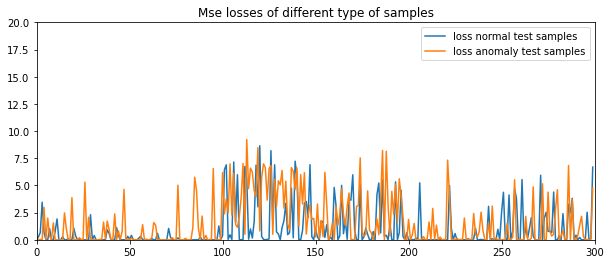

In [78]:
plt.figure(figsize=(10,4))

plt.plot(resul_norm, label='loss normal test samples')
plt.plot(resul_anormal, label='loss anomaly test samples')
plt.title('Mse losses of different type of samples')

plt.legend()
plt.xlim(0,300)
plt.ylim(0,20)
plt.show()

In [321]:
print (np.shape(liste_pred_norm))
print(np.shape(liste_pred_anomaly))

(11, 300, 143)
(11, 300, 143)


In [79]:
average_anormal= np.mean(liste_pred_anomaly, axis=(0))
average_anormal[101:102]
np.shape(average_anormal)

(300, 143)

In [42]:
(np.argsort(average_anormal[100:101]).tolist()).pop()[-25:]

[11,
 84,
 125,
 52,
 51,
 81,
 71,
 103,
 0,
 113,
 60,
 68,
 8,
 122,
 77,
 69,
 73,
 4,
 123,
 6,
 78,
 80,
 74,
 82,
 2]

In [80]:
#np.argsort(m[i:i+1]).tolist().pop(0)[-25:]

list_argmax=[]
for i in range(0, len(average_anormal)):
    val= np.argsort(average_anormal[i:i+1]).tolist().pop()[-5:]
    list_argmax.append(val)
list_argmax

[[52, 115, 113, 122, 87],
 [115, 54, 134, 122, 87],
 [25, 52, 2, 122, 103],
 [141, 0, 56, 103, 122],
 [82, 2, 80, 52, 122],
 [8, 57, 52, 119, 122],
 [6, 52, 51, 122, 2],
 [2, 57, 56, 51, 122],
 [6, 8, 2, 82, 122],
 [2, 56, 0, 122, 103],
 [38, 13, 52, 87, 113],
 [80, 82, 122, 8, 119],
 [115, 134, 86, 122, 87],
 [122, 14, 87, 52, 113],
 [2, 115, 113, 122, 87],
 [14, 24, 87, 122, 113],
 [80, 71, 53, 122, 52],
 [59, 52, 113, 122, 87],
 [113, 13, 0, 122, 103],
 [24, 14, 87, 122, 113],
 [52, 80, 69, 2, 122],
 [52, 47, 87, 113, 122],
 [54, 134, 122, 113, 87],
 [52, 56, 60, 122, 103],
 [0, 2, 113, 103, 122],
 [57, 103, 52, 2, 122],
 [137, 52, 87, 122, 113],
 [122, 86, 87, 52, 113],
 [68, 8, 52, 51, 122],
 [52, 57, 115, 54, 87],
 [8, 6, 82, 2, 122],
 [52, 65, 132, 122, 103],
 [0, 52, 2, 122, 103],
 [8, 82, 6, 2, 122],
 [52, 82, 8, 122, 119],
 [87, 54, 122, 52, 113],
 [119, 113, 8, 123, 122],
 [103, 57, 52, 119, 122],
 [86, 119, 87, 113, 122],
 [132, 123, 52, 103, 122],
 [54, 86, 113, 52, 87],
 

In [382]:
np.shape(list_argmax)

(300, 5)

In [44]:
(np.squeeze(list_argmax[20:21], axis=0))

array([ 52,  80,  69,   2, 122])

In [81]:
list_default=[]
for i in range(0, len(list_argmax)):
    j=0
    for elem in (np.squeeze(list_argmax[i:i+1], axis=0)):
        if elem not in y_train_sl_red:
            j = j+ int(np.squeeze(np.where(np.squeeze(list_argmax[i:i+1], axis=0) == elem), axis=0))**2 
    list_default.append(j)
list_default 

[0,
 5,
 0,
 4,
 4,
 1,
 0,
 5,
 9,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 5,
 1,
 1,
 5,
 0,
 0,
 0,
 0,
 0,
 10,
 4,
 5,
 0,
 1,
 1,
 1,
 9,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 16,
 9,
 1,
 10,
 4,
 1,
 0,
 0,
 14,
 1,
 1,
 1,
 4,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 13,
 1,
 0,
 0,
 4,
 4,
 0,
 5,
 1,
 4,
 0,
 0,
 1,
 4,
 0,
 4,
 1,
 0,
 14,
 0,
 0,
 0,
 1,
 0,
 10,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 9,
 14,
 13,
 20,
 14,
 14,
 1,
 13,
 1,
 0,
 13,
 14,
 9,
 0,
 26,
 10,
 10,
 21,
 1,
 5,
 26,
 1,
 26,
 17,
 5,
 29,
 0,
 26,
 9,
 25,
 14,
 13,
 16,
 4,
 0,
 4,
 4,
 14,
 25,
 21,
 26,
 5,
 14,
 1,
 16,
 4,
 9,
 10,
 26,
 17,
 9,
 1,
 4,
 0,
 4,
 0,
 25,
 29,
 10,
 14,
 0,
 0,
 14,
 4,
 13,
 0,
 9,
 20,
 20,
 25,
 0,
 0,
 4,
 1,
 1,
 1,
 0,
 0,
 0,
 29,
 0,
 1,
 0,
 1,
 1,
 4,
 29,
 20,
 0,
 20,
 13,
 9,
 5,
 0,
 1,
 0,
 1,
 5,
 26,
 0,
 0,
 25,
 30,
 4,
 10,
 4,
 5,
 0,
 9,
 1,
 5,
 14,
 1,
 5,
 1,
 5,
 25,
 5,
 21,
 5,
 1,
 10,
 26,
 5,
 1,
 29,
 5,
 14,
 10,
 30,
 1,
 5,
 5,
 14,
 1,

In [390]:
np.shape(list_default)

(300,)

In [82]:
average_normal= np.mean(liste_pred_norm, axis=(0))
average_normal[101:102]
np.shape(average_normal)

list_argmax=[]
for i in range(0, len(average_normal)):
    val= np.argsort(average_normal[i:i+1]).tolist().pop()[-5:]
    list_argmax.append(val)
list_argmax

list_default_norm=[]
for i in range(0, len(list_argmax)):
    j=0
    for elem in (np.squeeze(list_argmax[i:i+1], axis=0)) :
        if elem not in y_train_sl_red:
            j = j+ int(np.squeeze(np.where(np.squeeze(list_argmax[i:i+1], axis=0) == elem), axis=0))**2
    list_default_norm.append(j)
list_default_norm 


[0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 5,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 4,
 0,
 5,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 4,
 0,
 1,
 5,
 1,
 0,
 1,
 5,
 0,
 1,
 9,
 0,
 0,
 0,
 0,
 1,
 0,
 4,
 0,
 10,
 0,
 0,
 0,
 0,
 4,
 1,
 1,
 0,
 0,
 20,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 9,
 0,
 0,
 1,
 1,
 0,
 0,
 5,
 1,
 0,
 10,
 13,
 0,
 1,
 0,
 1,
 1,
 0,
 5,
 21,
 4,
 13,
 0,
 0,
 10,
 0,
 0,
 5,
 0,
 17,
 0,
 1,
 4,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 29,
 0,
 1,
 13,
 1,
 4,
 4,
 13,
 14,
 1,
 1,
 1,
 10,
 0,
 0,
 10,
 0,
 0,
 4,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 20,
 0,
 1,
 4,
 0,
 0,
 10,
 0,
 0,
 4,
 1,
 0,
 1,
 1,
 1,
 9,
 0,
 1,
 0,
 0,
 13,
 0,
 0,
 0,
 1,
 9,
 0,
 1,
 1,
 0,
 0,
 10,
 1,
 1,
 1,
 5,
 5,
 1,
 14,
 10,
 1,
 13,
 1,
 4,
 5,
 5,
 1,
 0,
 5,
 5,
 10,
 10,
 0,
 1,
 1,
 5,
 5,
 5,
 9,
 1,
 4,
 9,
 1,
 4,
 4,
 5,
 5,
 5,
 1,
 5,
 4,
 1,
 5,
 5,
 5,
 

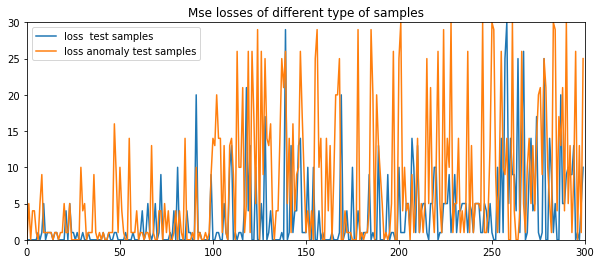

In [83]:
plt.figure(figsize=(10,4))

#plt.plot(resul_norm, label='loss normal test samples')
#plt.plot(resul_anormal, label='loss anomaly test samples')
plt.plot(list_default_norm, label='loss  test samples')
plt.plot(list_default, label='loss anomaly test samples')
#plt.plot(resul_anormal5del, label='loss anomaly test samples')
plt.title('Mse losses of different type of samples')

plt.legend()
plt.xlim(0,300)
plt.ylim(0,30)
plt.show()

In [87]:


final_norm=(list_default_norm)*resul_norm
final_anormal=(list_default)*resul_anormal

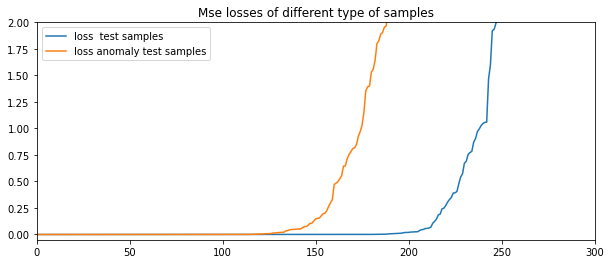

In [222]:
plt.figure(figsize=(10,4))

#plt.plot(resul_norm, label='loss normal test samples')
#plt.plot(resul_anormal, label='loss anomaly test samples')
plt.plot(np.sort(final_norm), label='loss  test samples')
plt.plot(np.sort(final_anormal), label='loss anomaly test samples')
#plt.plot(resul_anormal5del, label='loss anomaly test samples')
plt.title('Mse losses of different type of samples')

plt.legend()
plt.xlim(0,300)
plt.ylim(-0.05,2)
plt.show()

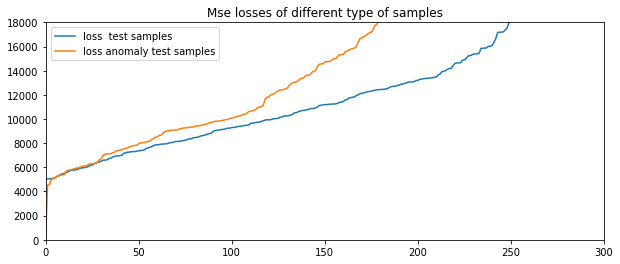

In [216]:
plt.figure(figsize=(10,4))

#plt.plot(resul_norm, label='loss normal test samples')
#plt.plot(resul_anormal, label='loss anomaly test samples')
plt.plot(np.sort(final_norm_am), label='loss  test samples')
plt.plot(np.sort(final_anormal_am), label='loss anomaly test samples')
#plt.plot(resul_anormal5del, label='loss anomaly test samples')
plt.title('Mse losses of different type of samples')

plt.legend()
plt.xlim(0,300)
plt.ylim(0,18000)
plt.show()

In [54]:
def loadList(filename):
    # the filename should mention the extension 'npy'
    tempNumpyArray=np.load(filename)
    return tempNumpyArray.tolist()

In [90]:
listautoencodertest=loadList('liste_test_autoencoder_slider.npy')
listautoencoderanomaly =loadList('liste_anomaly_autoencoder_slider.npy') 

lat=np.array(listautoencodertest)
laa=np.array(listautoencoderanomaly)

In [191]:
final_norm_am=((((((list_default_norm*resul_norm)**np.log(lat*500))*listmean_test_autoencoder_slider)+(r2_test_autoencoder_slider**4))*(mse_test_autoencoder_slider*100))+(np.abs(r_test_autoencoder_slider*1000)))
final_anormal_am=((((((list_default*resul_anormal)**np.log(laa*500))*listmean_anomaly_autoencoder_slider)+(r2_anomaly_autoencoder_slider**4))*(mse_anomaly_autoencoder_slider*100))+(np.abs(r_anomaly_autoencoder_slider*1000)))

In [153]:
listmean_anomaly_autoencoder_slider=loadList('listmean_anomaly_autoencoder_slider.npy')
listmean_test_autoencoder_slider=loadList('listmean_test_autoencoder_slider.npy')

r2_test_autoencoder_slider=loadList('r2_test_autoencoder_slider.npy')
r2_anomaly_autoencoder_slider=loadList('r2_anomaly_autoencoder_slider.npy')

mse_test_autoencoder_slider=loadList('mse_test_autoencoder_slider.npy')
mse_anomaly_autoencoder_slider=loadList('mse_anomaly_autoencoder_slider.npy')

r_test_autoencoder_slider=loadList('r_test_autoencoder_slider.npy')
r_anomaly_autoencoder_slider=loadList('r_anomaly_autoencoder_slider.npy')

In [154]:
listmean_anomaly_autoencoder_slider=np.array(listmean_anomaly_autoencoder_slider)
listmean_test_autoencoder_slider=np.array(listmean_test_autoencoder_slider)

r2_test_autoencoder_slider=np.array(r2_test_autoencoder_slider)
r2_anomaly_autoencoder_slider=np.array(r2_anomaly_autoencoder_slider)

mse_test_autoencoder_slider=np.array(mse_test_autoencoder_slider)
mse_anomaly_autoencoder_slider=np.array(mse_anomaly_autoencoder_slider)

r_test_autoencoder_slider=np.array(r_test_autoencoder_slider)
r_anomaly_autoencoder_slider=np.array(r_anomaly_autoencoder_slider)

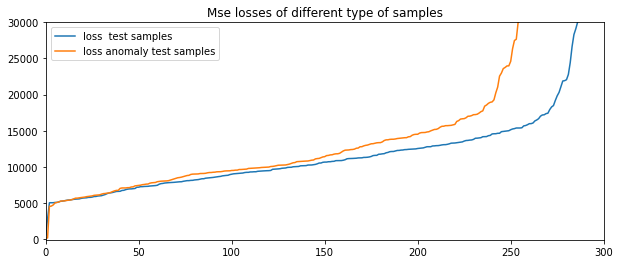

In [218]:
plt.figure(figsize=(10,4))

#plt.plot(resul_norm, label='loss normal test samples')
#plt.plot(resul_anormal, label='loss anomaly test samples')
plt.plot(np.sort(np.abs(r_test_autoencoder_slider*1000)), label='loss  test samples')
plt.plot(np.sort(np.abs(r_anomaly_autoencoder_slider*1000)), label='loss anomaly test samples')
#plt.plot(resul_anormal5del, label='loss anomaly test samples')
plt.title('Mse losses of different type of samples')

plt.legend()
plt.xlim(0,300)
plt.ylim(-100,30000)
plt.show()

In [207]:
a=np.sort(final_norm_am)
print(a)

[5.03066544e+03 5.03086009e+03 5.05533845e+03 5.07078983e+03
 5.08315322e+03 5.13692932e+03 5.24622683e+03 5.29906339e+03
 5.40294780e+03 5.46455480e+03 5.50028440e+03 5.56061722e+03
 5.63025319e+03 5.71816745e+03 5.75665395e+03 5.77070713e+03
 5.78672592e+03 5.81499819e+03 5.89941683e+03 5.93573561e+03
 5.96847560e+03 5.98094171e+03 6.00701113e+03 6.08055250e+03
 6.16830406e+03 6.18780843e+03 6.29213807e+03 6.37938474e+03
 6.40280631e+03 6.45425823e+03 6.52299723e+03 6.59221513e+03
 6.60014238e+03 6.61620727e+03 6.72963308e+03 6.75115652e+03
 6.84361223e+03 6.91121839e+03 6.94529531e+03 6.94675200e+03
 6.96850179e+03 7.00559331e+03 7.17384804e+03 7.18316337e+03
 7.25517078e+03 7.25782227e+03 7.29429040e+03 7.29733571e+03
 7.30479427e+03 7.34299867e+03 7.36125701e+03 7.38456500e+03
 7.40678989e+03 7.44858569e+03 7.55988480e+03 7.59616872e+03
 7.67554972e+03 7.70579311e+03 7.80983119e+03 7.85483246e+03
 7.85556513e+03 7.88391687e+03 7.91638562e+03 7.92986521e+03
 7.93649693e+03 7.943465